In [26]:
!pip install boto3
!pip install resampy

In [27]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

2.8.0+cu126
2.8.0+cu126


In [28]:
import io
import os
import math
import tarfile
import tempfile
import timeit
import librosa
import matplotlib.colors as mcolors
import pandas as pd
import boto3
import matplotlib.pyplot as plt
import requests
import resampy
from botocore import UNSIGNED
from botocore.config import Config
from IPython.display import Audio
from torchaudio.utils import download_asset
from IPython.display import Audio
def _hide_seek(obj):
    class _wrapper:
        def __init__(self, obj):
            self.obj = obj

        def read(self, n):
            return self.obj.read(n)

    return _wrapper(obj)

In [29]:
audio_path=[]
audio_path.append("./095522039.m4a")
audio_path.append("./095522040.m4a")
audio_path.append("./095522041.m4a")
audio_path.append("./095522042.m4a")
metadata=[]
waveform=[]
sample_rate=[]
for p in audio_path:
    metadata.append(torchaudio.info(p))
    temp_waveform, temp_sample_rate = torchaudio.load(p)
    waveform.append(temp_waveform)
    sample_rate.append(temp_sample_rate)
print(waveform)
print(sample_rate)

[tensor([[0., -0., 0.,  ..., 0., 0., 0.]]), tensor([[0., -0., 0.,  ..., 0., 0., 0.]]), tensor([[0., -0., 0.,  ..., 0., 0., 0.]]), tensor([[0., -0., 0.,  ..., 0., 0., 0.]])]
[44100, 44100, 44100, 44100]


/tmp/ipython-input-2886642169.py:10: UserWarning: torchaudio._backend.utils.info has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  metadata.append(torchaudio.info(p))
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:20: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  s = torchaud

In [30]:
def plot_waveform(waveform, sample_rate):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
    figure.suptitle("waveform")

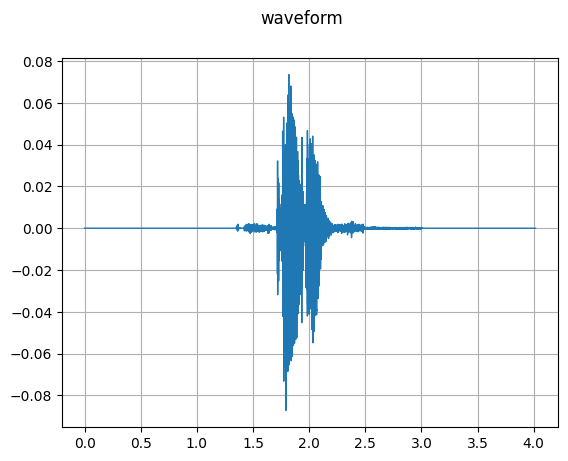

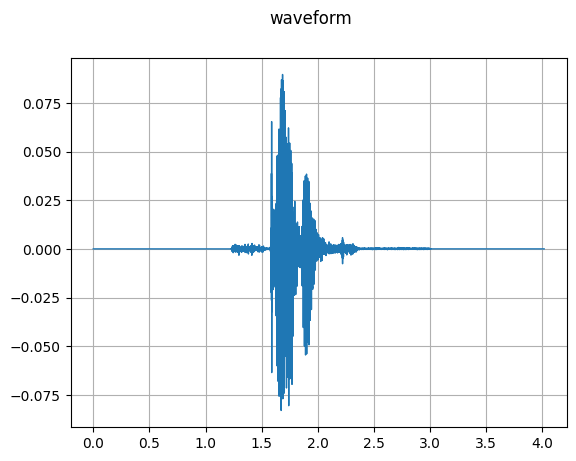

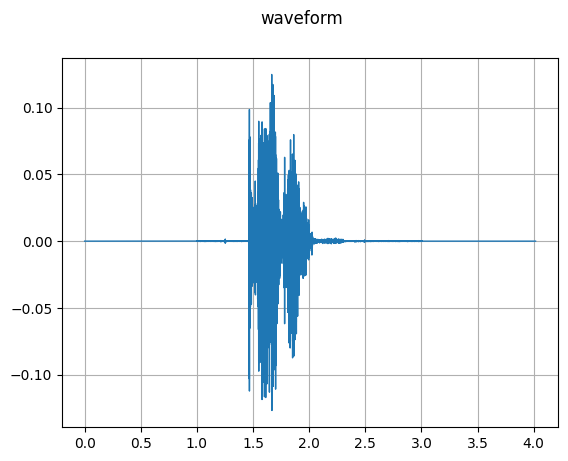

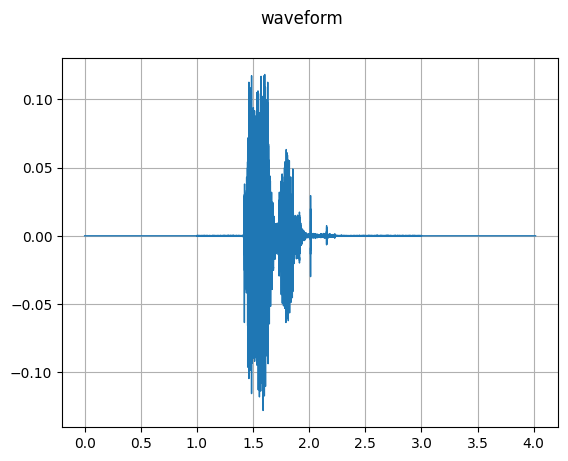

In [31]:
for i in range(4):
  plot_waveform(waveform[i], sample_rate[i])

In [32]:
def plot_specgram(waveform, sample_rate, title="Spectrogram"):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
    figure.suptitle(title)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


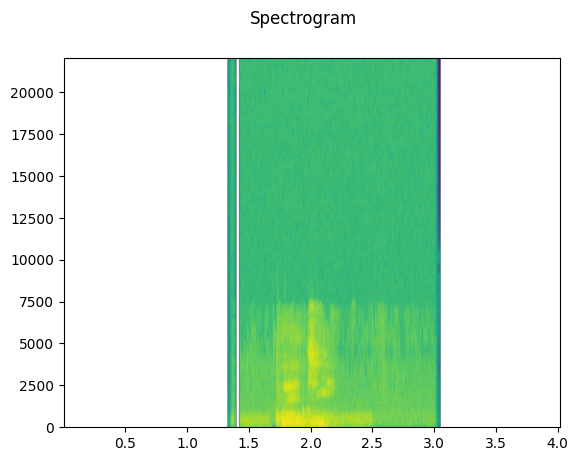

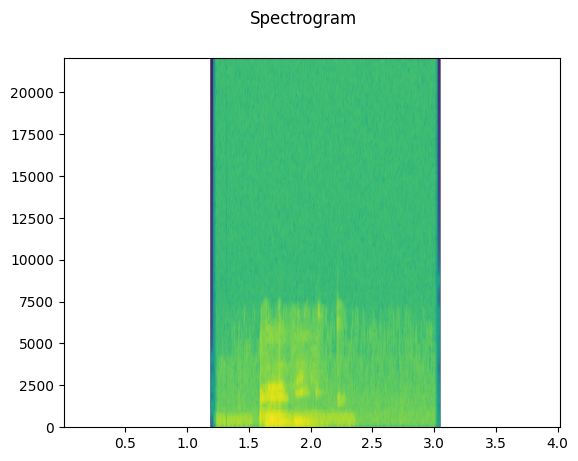

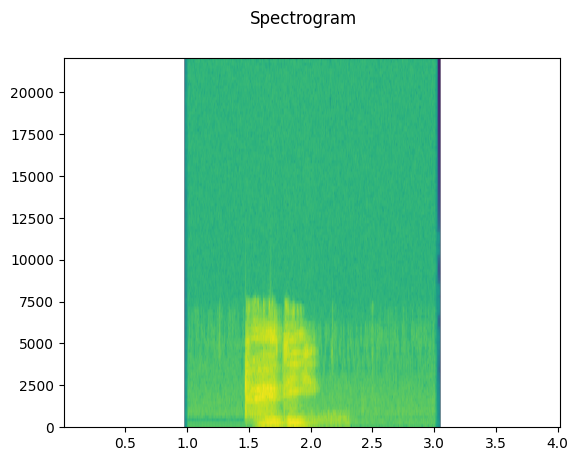

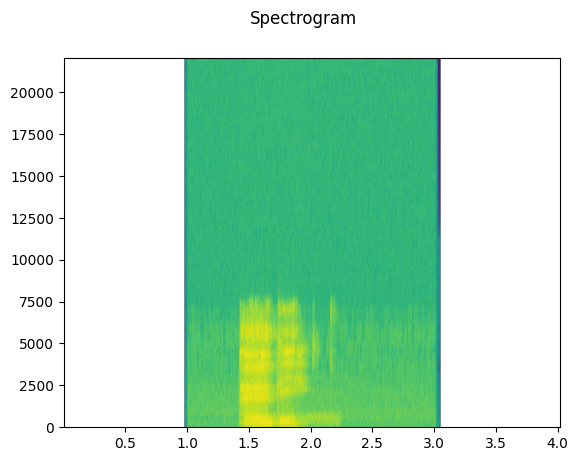

In [33]:
for i in range(4):
  plot_specgram(waveform[i], sample_rate[i])

In [34]:
Audio(waveform[0].numpy()[0], rate=sample_rate[0])

In [35]:
Audio(waveform[1].numpy()[0], rate=sample_rate[1])

In [36]:
Audio(waveform[2].numpy()[0], rate=sample_rate[2])

In [37]:
Audio(waveform[3].numpy()[0], rate=sample_rate[3])

In [38]:
DEFAULT_OFFSET = 201
def _get_log_freq(sample_rate, max_sweep_rate, offset):
    """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

    offset is used to avoid negative infinity `log(offset + x)`.

    """
    start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
    return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset


def _get_inverse_log_freq(freq, sample_rate, offset):
    """Find the time where the given frequency is given by _get_log_freq"""
    half = sample_rate // 2
    return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))
def _get_freq_ticks(sample_rate, offset, f_max):
    # Given the original sample rate used for generating the sweep,
    # find the x-axis value where the log-scale major frequency values fall in
    times, freq = [], []
    for exp in range(2, 5):
        for v in range(1, 10):
            f = v * 10**exp
            if f < sample_rate // 2:
                t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
                times.append(t)
                freq.append(f)
    t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
    times.append(t_max)
    freq.append(f_max)
    return times, freq

def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal
def plot_sweep(
    waveform,
    sample_rate,
    title,
    max_sweep_rate=44100,
    offset=DEFAULT_OFFSET,
):
    x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
    y_ticks = [1000, 5000, 10000, 20000, sample_rate // 2]

    time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
    freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
    freq_y = [f for f in freq if f in y_ticks and 1000 <= f <= sample_rate // 2]

    figure, axis = plt.subplots(1, 1)
    _, _, _, cax = axis.specgram(waveform[0].numpy(), Fs=sample_rate)
    plt.xticks(time, freq_x)
    plt.yticks(freq_y, freq_y)
    axis.set_xlabel("Original Signal Frequency (Hz, log scale)")
    axis.set_ylabel("Waveform Frequency (Hz)")
    axis.xaxis.grid(True, alpha=0.67)
    axis.yaxis.grid(True, alpha=0.67)
    figure.suptitle(f"{title} (sample rate: {sample_rate} Hz)")
    plt.colorbar(cax)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


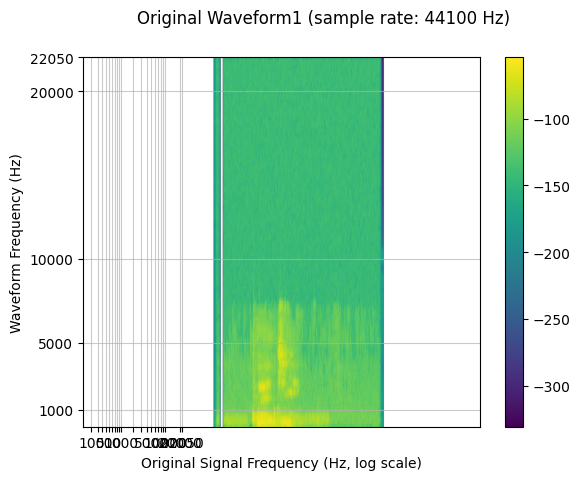

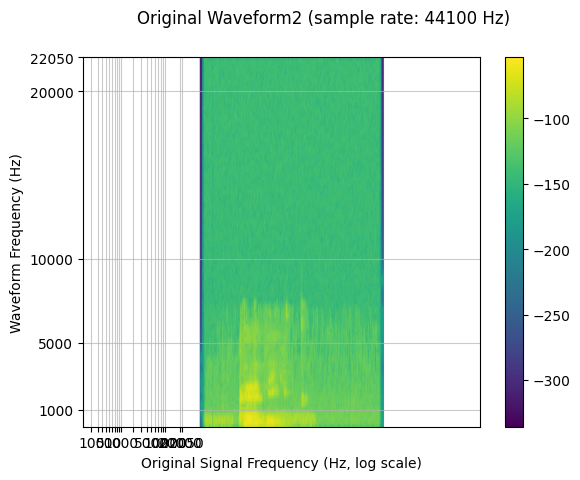

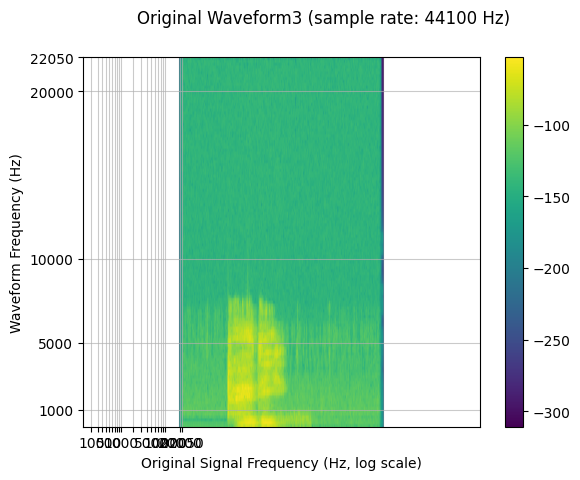

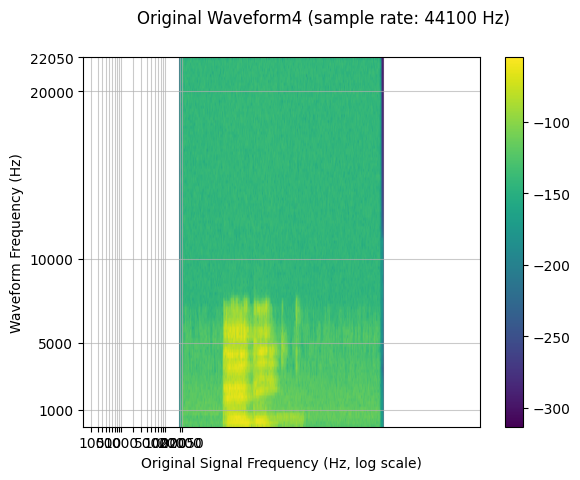

In [39]:
for i in range(4):
  plot_sweep(waveform[i], sample_rate[i], title=f"Original Waveform{i+1}")

In [40]:
for i in range(4):
  print(waveform[i])
  print(sample_rate[i])

tensor([[0., -0., 0.,  ..., 0., 0., 0.]])
44100
tensor([[0., -0., 0.,  ..., 0., 0., 0.]])
44100
tensor([[0., -0., 0.,  ..., 0., 0., 0.]])
44100
tensor([[0., -0., 0.,  ..., 0., 0., 0.]])
44100


/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


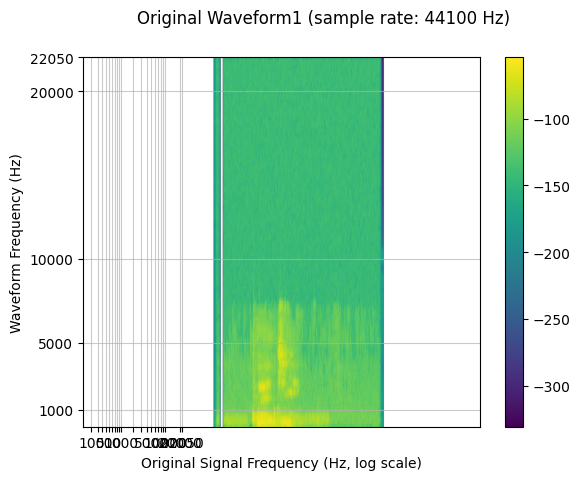

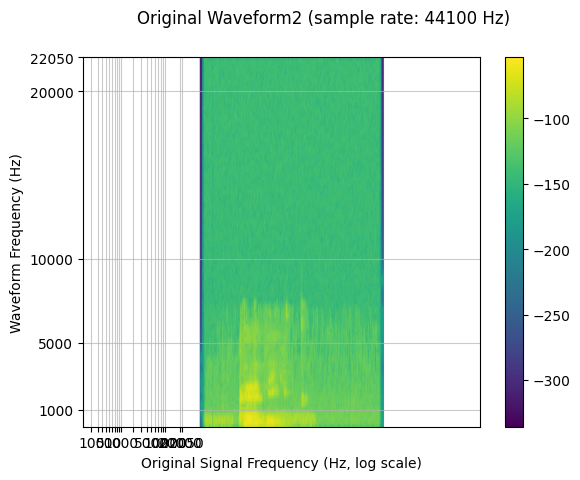

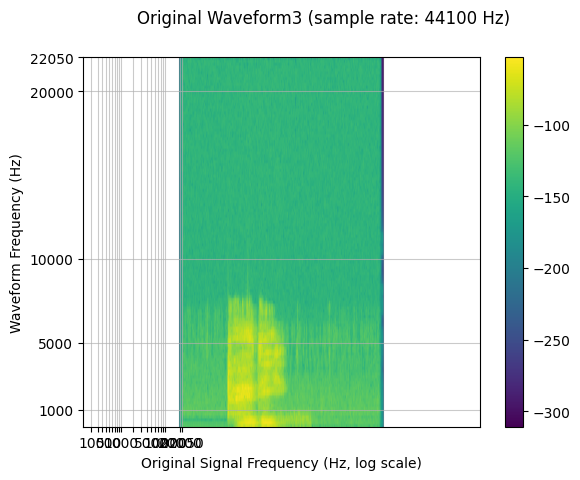

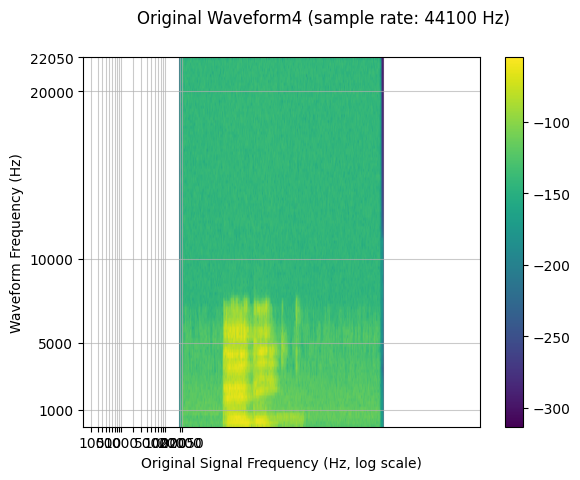

In [41]:
for i in range(4):
  plot_sweep(waveform[i], sample_rate[i], title=f"Original Waveform{i+1}")


In [42]:
Audio(waveform[0].numpy()[0], rate=sample_rate[0])

In [43]:
Audio(waveform[1].numpy()[0], rate=sample_rate[1])

In [44]:
Audio(waveform[2].numpy()[0], rate=sample_rate[2])

In [45]:
Audio(waveform[3].numpy()[0], rate=sample_rate[3])

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


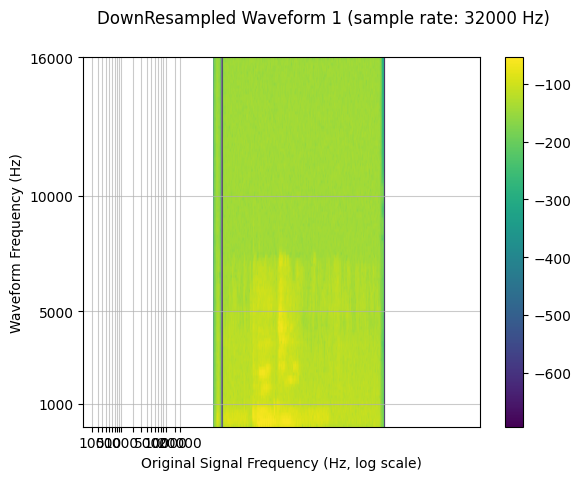

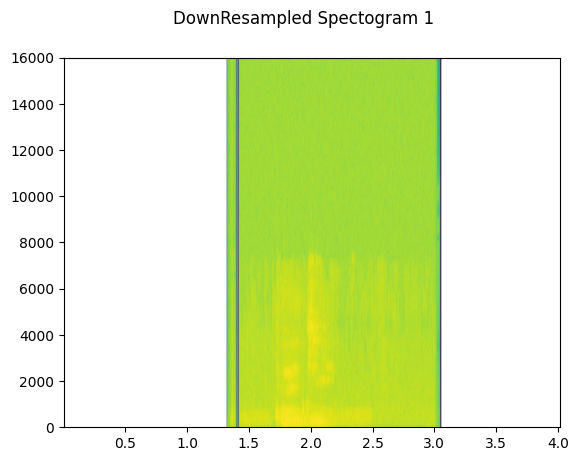

In [51]:
resample_rate = 32000
resampler = T.Resample(sample_rate[0], resample_rate, dtype=waveform[0].dtype)
resampled_waveform = resampler(waveform[0])

plot_sweep(resampled_waveform, resample_rate, title="DownResampled Waveform 1")
plot_specgram(resampled_waveform, resample_rate, title="DownResampled Spectogram 1")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


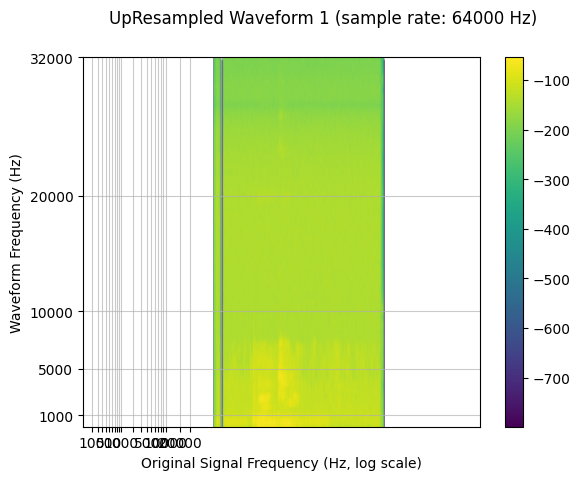

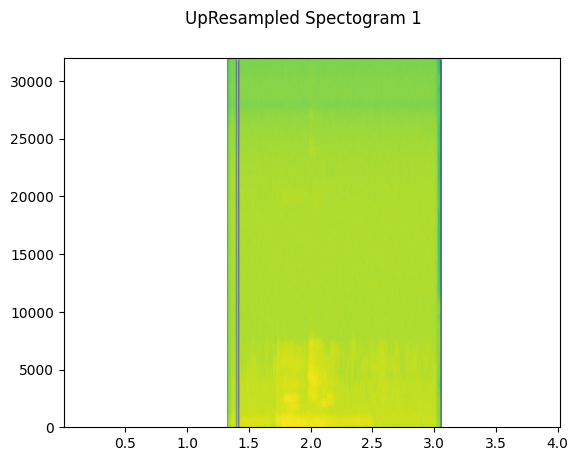

In [52]:
resample_rate = 64000
resampler = T.Resample(sample_rate[0], resample_rate, dtype=waveform[0].dtype)
resampled_waveform = resampler(waveform[0])

plot_sweep(resampled_waveform, resample_rate, title="UpResampled Waveform 1")
plot_specgram(resampled_waveform, resample_rate, title="UpResampled Spectogram 1")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

tensor([0., 0., 0.,  ..., 0., 0., 0.])


/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


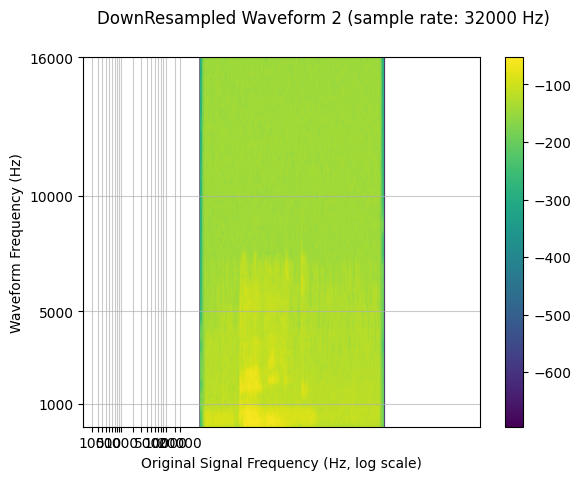

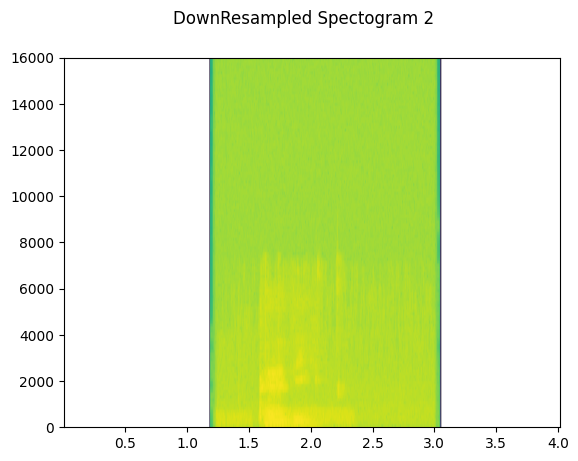

In [57]:
resample_rate = 32000
resampler = T.Resample(sample_rate[1], resample_rate, dtype=waveform[1].dtype)
resampled_waveform = resampler(waveform[1])

plot_sweep(resampled_waveform, resample_rate, title="DownResampled Waveform 2")
plot_specgram(resampled_waveform, resample_rate, title="DownResampled Spectogram 2")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)


/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


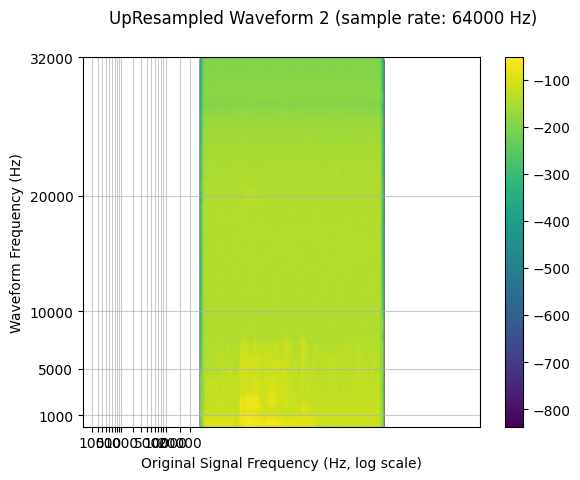

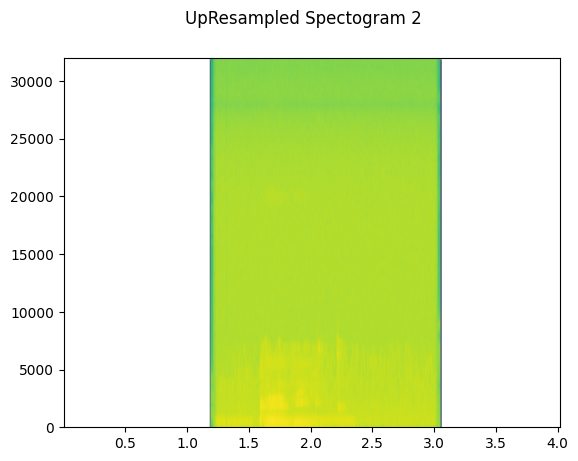

In [55]:
resample_rate = 64000
resampler = T.Resample(sample_rate[1], resample_rate, dtype=waveform[1].dtype)
resampled_waveform = resampler(waveform[1])

plot_sweep(resampled_waveform, resample_rate, title="UpResampled Waveform 2")
plot_specgram(resampled_waveform, resample_rate, title="UpResampled Spectogram 2")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


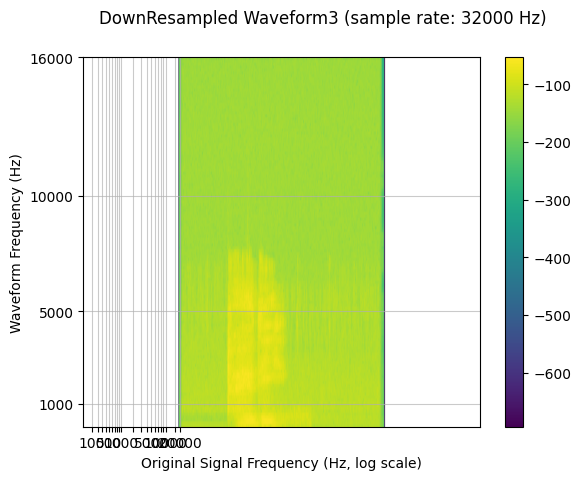

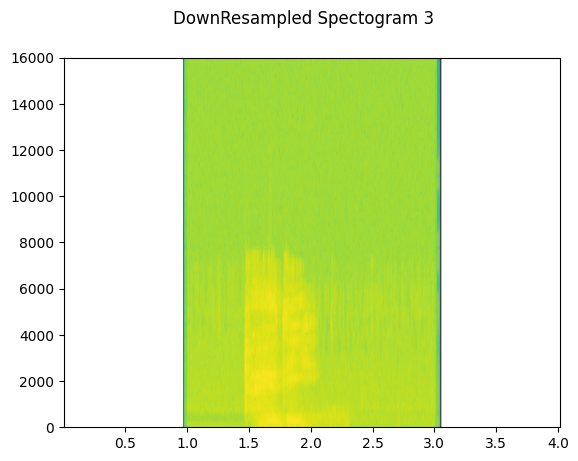

In [59]:
resample_rate = 32000
resampler = T.Resample(sample_rate[2], resample_rate, dtype=waveform[2].dtype)
resampled_waveform = resampler(waveform[2])

plot_sweep(resampled_waveform, resample_rate, title="DownResampled Waveform3")
plot_specgram(resampled_waveform, resample_rate, title="DownResampled Spectogram 3")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


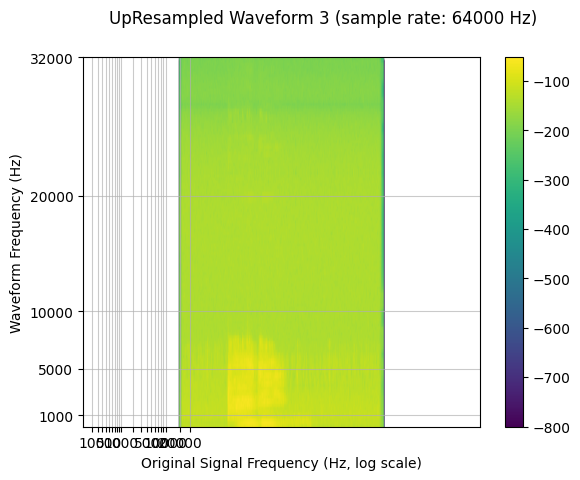

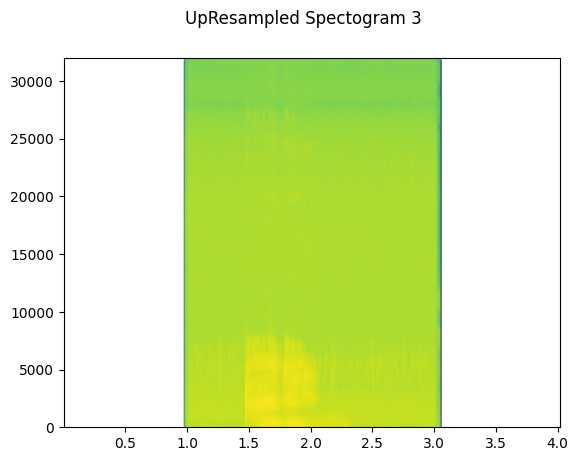

In [60]:
resample_rate = 64000
resampler = T.Resample(sample_rate[2], resample_rate, dtype=waveform[2].dtype)
resampled_waveform = resampler(waveform[2])

plot_sweep(resampled_waveform, resample_rate, title="UpResampled Waveform 3")
plot_specgram(resampled_waveform, resample_rate, title="UpResampled Spectogram 3")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


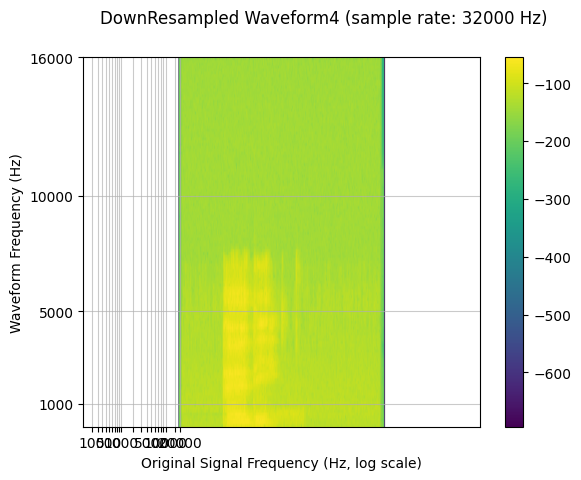

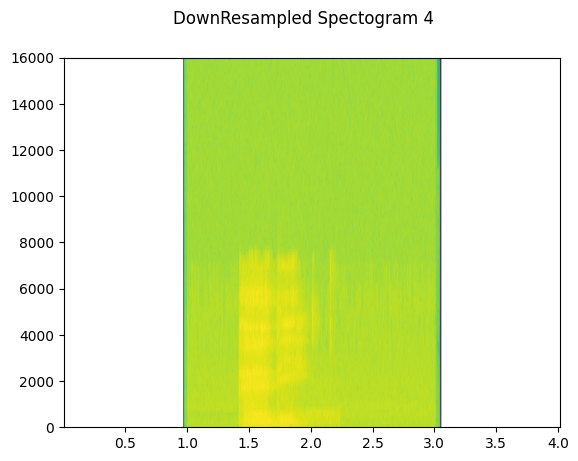

In [61]:
resample_rate = 32000
resampler = T.Resample(sample_rate[3], resample_rate, dtype=waveform[3].dtype)
resampled_waveform = resampler(waveform[3])

plot_sweep(resampled_waveform, resample_rate, title="DownResampled Waveform4")
plot_specgram(resampled_waveform, resample_rate, title="DownResampled Spectogram 4")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

/usr/local/lib/python3.12/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


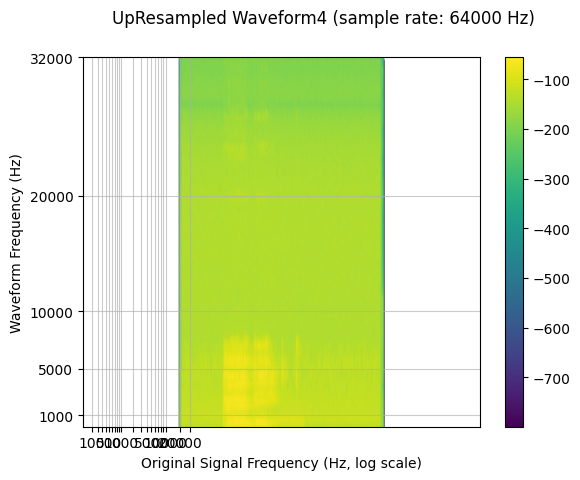

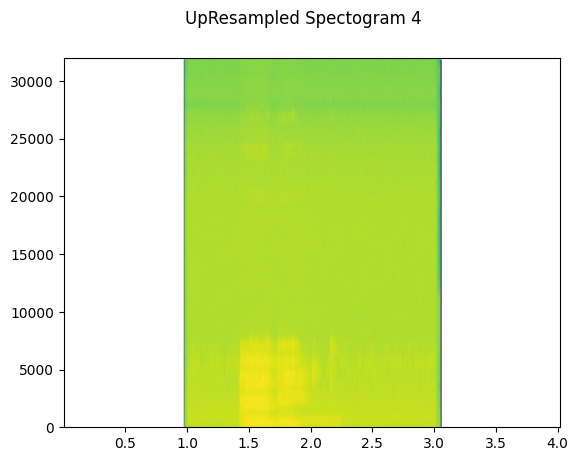

In [62]:
resample_rate = 64000
resampler = T.Resample(sample_rate[3], resample_rate, dtype=waveform[3].dtype)
resampled_waveform = resampler(waveform[3])

plot_sweep(resampled_waveform, resample_rate, title="UpResampled Waveform4")
plot_specgram(resampled_waveform, resample_rate, title="UpResampled Spectogram 4")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)